In [1]:
from __future__ import print_function
import os
import re
import numpy as np
import  pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import time
from scipy import signal

In [2]:
path_read='D:/Papers/LSTM encoder_decoder/code/data/'
path_save='D:/Papers/LSTM encoder_decoder/code/results/'

Function to calculate APD90

In [3]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

Reading text file data

Drug_free iPSC

In [4]:
columns=['AP']
Xt_control_ipsc=pd.DataFrame(columns=columns)
directory = os.listdir(path_read+"iPSC/control")
sorted(directory)
path=path_read+'iPSC/control/'
for filename in directory:
    path2=path+filename
    X1_control_ipsc = pd.read_fwf(path2, header=None)
    X13_control_ipsc = X1_control_ipsc.iloc[0:100, :].values 
    xm=pd.DataFrame({'AP': X13_control_ipsc[:,1]})
    X11_control_ipsc=X1_control_ipsc.loc[X1_control_ipsc[0]%1 == 0]
    X12_control_ipsc = X11_control_ipsc.iloc[:, :].values
    X21_control_ipsc=pd.DataFrame({'time': [0], 'AP': [-(xm['AP'].abs()).max()]})
    X22_control_ipsc=pd.DataFrame({'time': X12_control_ipsc[101:801,0], 'AP': X12_control_ipsc[101:801,1]})
    X2_control_ipsc=X21_control_ipsc.append(X22_control_ipsc, ignore_index=True, sort=False)
    X3_control_ipsc=X2_control_ipsc['AP']
    X4_control_ipsc=X3_control_ipsc.transpose()
    Xt_control_ipsc=Xt_control_ipsc.append(X4_control_ipsc, ignore_index=True, sort=False)
    
Xt_control_ipsc=Xt_control_ipsc.drop(['AP'], axis = 1)
Xt_control_ipsc.head()
Xplot_control_ipsc1=Xt_control_ipsc.iloc[:, :].values
Fi3_ipsc_control1=Xplot_control_ipsc1

Drug-free adult

In [5]:
columns=['AP']
Xt_control_adult=pd.DataFrame(columns=columns)

directory = os.listdir(path_read+"adult/control")
sorted(directory)
path=path_read+"adult/control/"
for filename in directory:
    path2=path+filename
    X_control_adult = pd.read_csv(path2, sep="\t", header=None)
    X1_control_adult=X_control_adult.loc[X_control_adult[0]%1 == 0]
    X11_control_adult = X1_control_adult.iloc[:, :].values
    X2_control_adult=pd.DataFrame({'time': X11_control_adult[0:701,0], 'AP': X11_control_adult[0:701,1]})
    X3_control_adult=X2_control_adult['AP']
    X4_control_adult=X3_control_adult.transpose()
    Xt_control_adult=Xt_control_adult.append(X4_control_adult, ignore_index=True, sort=False)
    
Xt_control_adult=Xt_control_adult.drop(['AP'], axis = 1)
Xt_control_adult.head()
Xplot_control_adult1=Xt_control_adult.iloc[:, :].values
Fi3_adult_control1 = Xplot_control_adult1

Druged iPSC

In [6]:
columns=['AP']
Xt_Block_ipsc=pd.DataFrame(columns=columns)
directory = os.listdir(path_read+"iPSC/Block")
sorted(directory)
xread=['filename','value']
path=path_read+"iPSC/Block/"
for filename in directory: 
    path2=path+filename
    X1_Block_ipsc = pd.read_fwf(path2, header=None)
    X13_Block_ipsc = X1_Block_ipsc.iloc[0:100, :].values 
    xm=pd.DataFrame({'AP': X13_Block_ipsc[:,1]})
    X11_Block_ipsc=X1_Block_ipsc.loc[X1_Block_ipsc[0]%1 == 0]
    X12_Block_ipsc = X11_Block_ipsc.iloc[:, :].values
    X21_Block_ipsc=pd.DataFrame({'time': [X13_Block_ipsc[0]], 'AP': [-(xm['AP'].abs()).max()]})
    X22_Block_ipsc=pd.DataFrame({'time': X12_Block_ipsc[101:801,0], 'AP': X12_Block_ipsc[101:801,1]})
    X2_Block_ipsc=X21_Block_ipsc.append(X22_Block_ipsc, ignore_index=True, sort=False)
    X3_Block_ipsc=X2_Block_ipsc['AP']
    X4_Block_ipsc=X3_Block_ipsc.transpose()
    Xt_Block_ipsc=Xt_Block_ipsc.append(X4_Block_ipsc, ignore_index=True, sort=False)

Xt_Block_ipsc2=Xt_Block_ipsc.drop(['AP'], axis = 1)
Xt_Block_ipsc2.head()
Xplot_Block_ipsc1=Xt_Block_ipsc2.iloc[:, :].values
Fi3_ipsc_block1 = Xplot_Block_ipsc1

Druged adult

In [7]:
columns=['AP']
Xt_Block_adult=pd.DataFrame(columns=columns)

directory = os.listdir(path_read+"adult/Block")
sorted(directory)
path=path_read+"adult/Block/"
for filename in directory:
#     print(filename)
    path2=path+filename
    X_Block_adult = pd.read_csv(path2, sep="\t", header=None)
    X1_Block_adult=X_Block_adult.loc[X_Block_adult[0]%1 == 0]
    X11_Block_adult = X1_Block_adult.iloc[:, :].values
    X2_Block_adult=pd.DataFrame({'time': X11_Block_adult[0:701,0], 'AP': X11_Block_adult[0:701,1]})
    X3_Block_adult=X2_Block_adult['AP']
    X4_Block_adult=X3_Block_adult.transpose()
    Xt_Block_adult=Xt_Block_adult.append(X4_Block_adult, ignore_index=True, sort=False)
Xt_Block_adult2=Xt_Block_adult.drop(['AP'], axis = 1)
Xt_Block_adult2.head()
Xplot_Block_adult1=Xt_Block_adult2.iloc[:, :].values
Fi3_adult_block1=Xplot_Block_adult1

Figure1 subplots

In [8]:
X_ipsc_baseline = pd.read_csv(path_read + "ipsc_baseline.csv",header=None)
X_adult_baseline = pd.read_csv(path_read + "adult_baseline.csv",header=None)
ipsc_current = pd.read_csv(path_read + "current_ipsc.csv",header=None)
adult_current = pd.read_csv(path_read + "current_adult.csv",header=None)

#Baseline
t_ipsc_baseline = X_ipsc_baseline.iloc[:, 0].values
X_ipsc_baseline = X_ipsc_baseline.iloc[:, 1].values
t_adult_baseline = X_adult_baseline.iloc[:, 0].values
X_adult_baseline = X_adult_baseline.iloc[:, 1].values

#ipsc current
t_ipsc=ipsc_current.iloc[:, 0].values
ipsc_vm_plot=ipsc_current.iloc[:, 1].values
ipsc_ical_plot=ipsc_current.iloc[:, 3].values
ipsc_ikr_plot=ipsc_current.iloc[:, 4].values
ipsc_iks_plot=ipsc_current.iloc[:, 5].values
ipsc_ito_plot=ipsc_current.iloc[:, 6].values
ipsc_ik1_plot=ipsc_current.iloc[:, 7].values

#adult current
t_adult=adult_current.iloc[:, 0].values
adult_vm_plot = adult_current.iloc[:, 1].values
adult_ical_plot = adult_current.iloc[:, 3].values
adult_ikr_plot = adult_current.iloc[:, 4].values
adult_iks_plot = adult_current.iloc[:, 5].values
adult_ito_plot = adult_current.iloc[:, 6].values
adult_ik1_plot = adult_current.iloc[:, 7].values

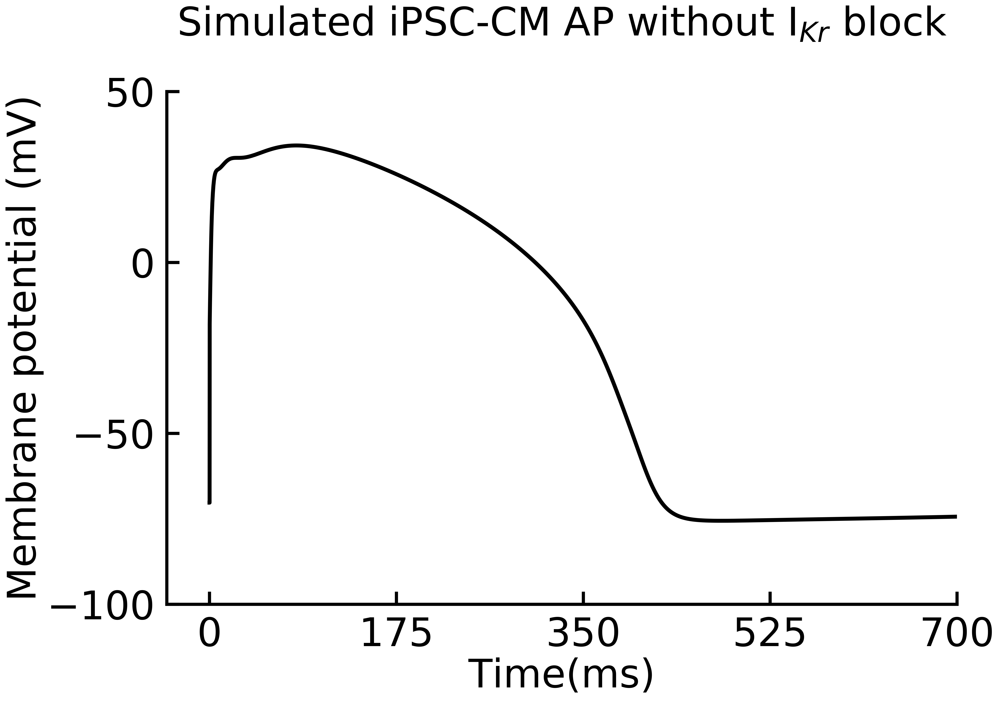

In [9]:
plt.figure(num=None, figsize=(18, 12), dpi=300)
plt.rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)  
# ax = plt.subplot(111) 
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)  
plt.xticks(np.arange(0,701, step=175),fontsize=50) 
plt.yticks(np.arange(-100,51, step=50),fontsize=50)
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.plot(t_ipsc_baseline , X_ipsc_baseline.transpose(),linewidth=5,color=[0,0,0])
plt.xlabel("Time(ms)",fontsize=50)
plt.ylabel("Membrane potential (mV)",fontsize=50)
ttl = plt.title("Simulated iPSC-CM AP without I$_{Kr}$ block",fontsize=50)
ttl.set_position([.5, 1.1])
plt.savefig(path_save+'Fig1/Fig11.pdf', dpi = 300, bbox_inches = 'tight')

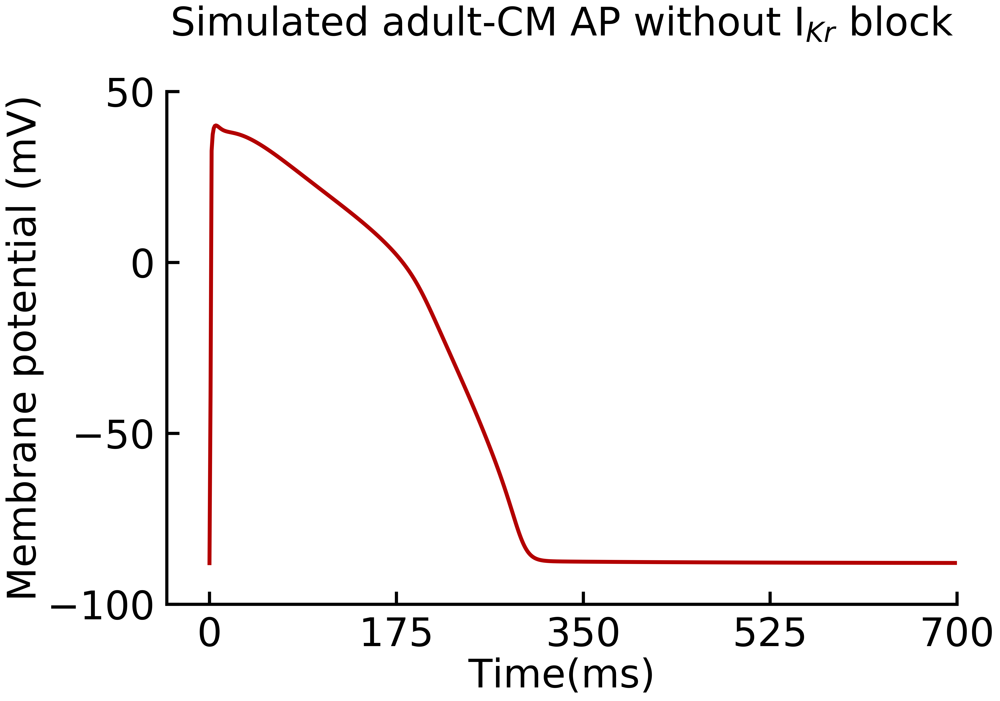

In [10]:
plt.figure(num=None, figsize=(18, 12), dpi=300)
plt.rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4) 
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)  
plt.xticks(np.arange(0,701, step=175),fontsize=50) 
plt.yticks(np.arange(-100,51, step=50),fontsize=50)  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.xticks(fontsize=50) 
plt.yticks(fontsize=50)
plt.plot(t_adult_baseline,X_adult_baseline.transpose(),linewidth=5,color=[0.7,0,0])
plt.xlabel("Time(ms)",fontsize=50)
plt.ylabel("Membrane potential (mV)",fontsize=50)
ttl = plt.title("Simulated adult-CM AP without I$_{Kr}$ block ",fontsize=50)
ttl.set_position([.5, 1.1])
plt.savefig(path_save+'Fig1/Fig12.pdf', dpi = 300, bbox_inches = 'tight')

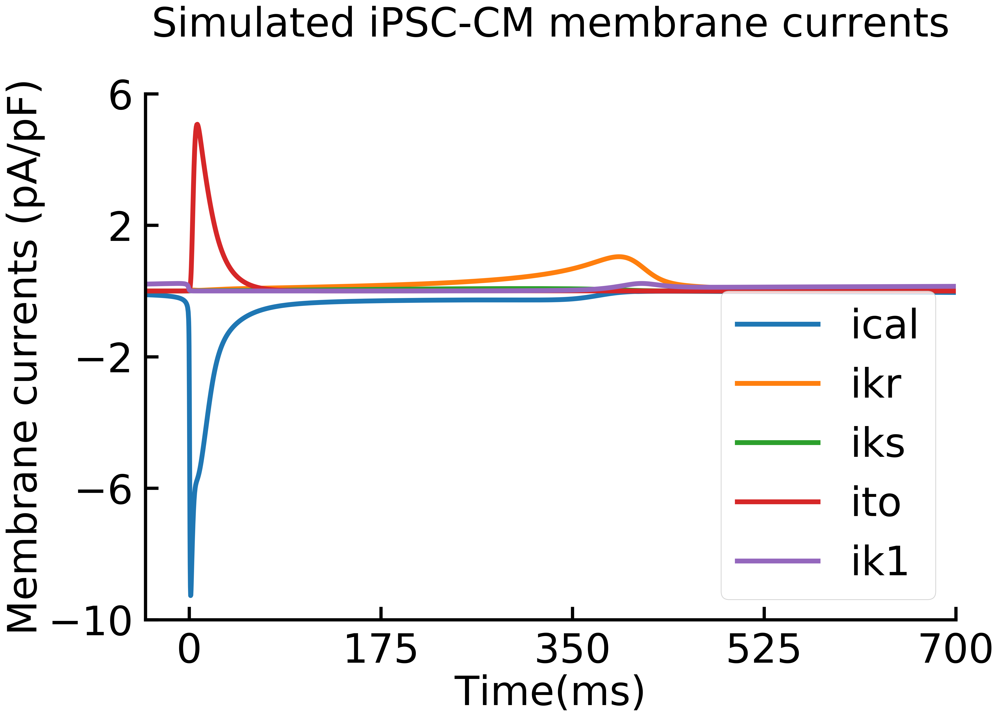

In [11]:
plt.figure(num=None, figsize=(18, 12), dpi=300)
plt.rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
plt.ylim(-10, 6) 
plt.xlim(-40, 700)    
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.xticks(np.arange(0,701, step=175),fontsize=50) 
plt.yticks(np.arange(-10,6.1, step=4),fontsize=50)
plt.plot(t_ipsc,ipsc_ical_plot,linewidth=6,label='ical')
plt.plot(t_ipsc,ipsc_ikr_plot,linewidth=6,label='ikr')
plt.plot(t_ipsc,ipsc_iks_plot,linewidth=6,label='iks')
plt.plot(t_ipsc,ipsc_ito_plot,linewidth=6,label='ito')
plt.plot(t_ipsc,ipsc_ik1_plot,linewidth=6,label='ik1')
plt.xlabel("Time(ms)",fontsize=50)
plt.ylabel("Membrane currents (pA/pF)",fontsize=50)
plt.legend(loc='lower right', prop={'size': 50})
ttl = plt.title("Simulated iPSC-CM membrane currents",fontsize=50)
ttl.set_position([.5, 1.1])
plt.savefig(path_save+'Fig1/Fig21.pdf', dpi = 300, bbox_inches = 'tight')

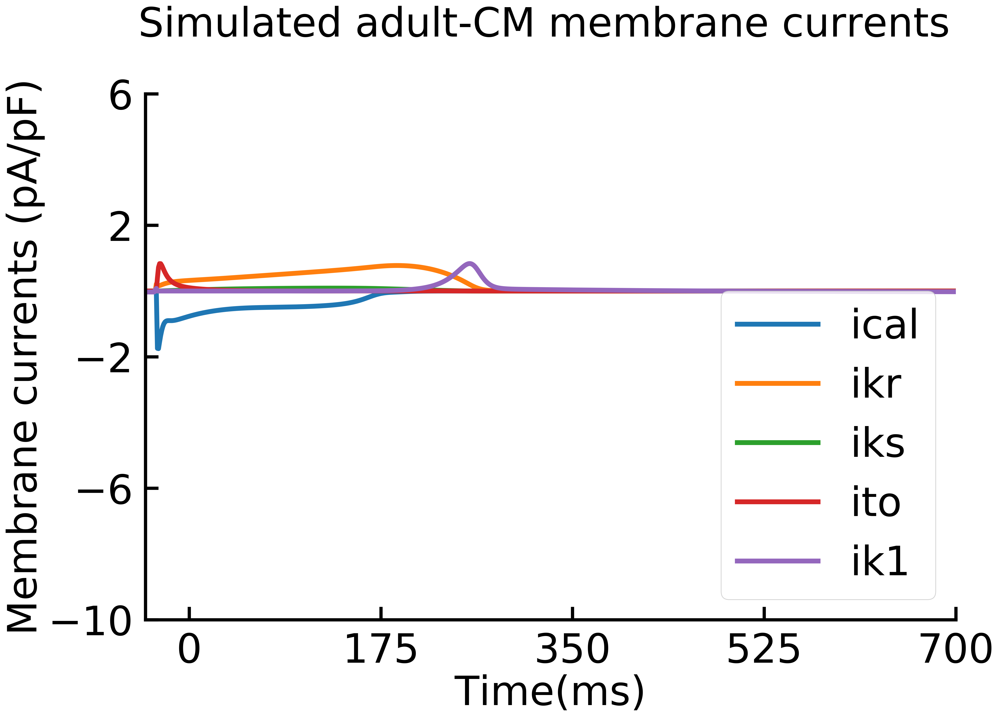

In [12]:
plt.figure(num=None, figsize=(18, 12), dpi=300)
plt.rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)    
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.ylim(-10, 6) 
plt.xlim(-40, 700)
plt.xticks(np.arange(0,701, step=175),fontsize=50) 
plt.yticks(np.arange(-10,6.1, step=4),fontsize=50) 
plt.plot(t_adult,adult_ical_plot,linewidth=6,label='ical')
plt.plot(t_adult,adult_ikr_plot,linewidth=6,label='ikr')
plt.plot(t_adult,adult_iks_plot,linewidth=6,label='iks')
plt.plot(t_adult,adult_ito_plot,linewidth=6,label='ito')
plt.plot(t_adult,adult_ik1_plot,linewidth=6,label='ik1')
plt.xlabel("Time(ms)",fontsize=50)
plt.ylabel("Membrane currents (pA/pF)",fontsize=50)
plt.legend(loc='lower right', prop={'size': 50})
ttl = plt.title("Simulated adult-CM membrane currents ",fontsize=50)
ttl.set_position([.5, 1.1])
plt.savefig(path_save+'Fig1/Fig22.pdf', dpi = 300, bbox_inches = 'tight')

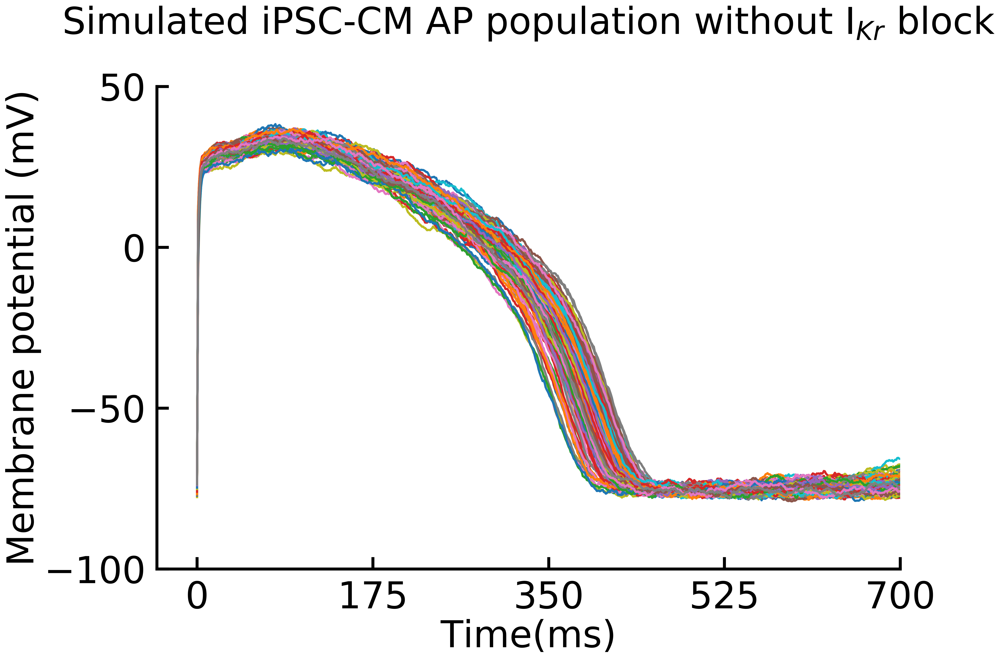

In [13]:
Xplot_control_ipsc1=Xt_control_ipsc.iloc[:, :].values
plt.figure(num=None, figsize=(18, 12), dpi=300)
plt.rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)    
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.xticks(np.arange(0,701, step=175),fontsize=50) 
plt.yticks(np.arange(-100,51, step=50),fontsize=50)
plt.plot(Xplot_control_ipsc1.transpose(),linewidth=3)
plt.xlabel("Time(ms)",fontsize=50)
plt.ylabel("Membrane potential (mV)",fontsize=50)
ttl = plt.title("Simulated iPSC-CM AP population without I$_{Kr}$ block",fontsize=50)
ttl.set_position([.5, 1.1])
plt.savefig(path_save+'Fig1/Fig31.pdf', dpi = 300, bbox_inches = 'tight')

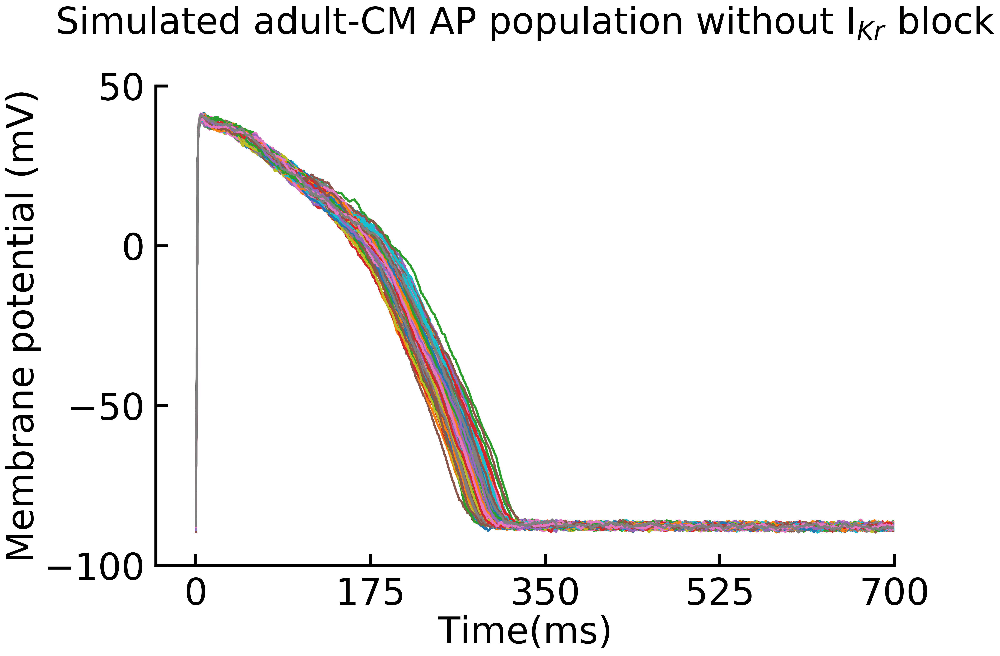

In [14]:
Xplot_control_adult1=Xt_control_adult.iloc[:, :].values
plt.figure(num=None, figsize=(18, 12), dpi=300)
plt.rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.xticks(np.arange(0,701, step=175),fontsize=50) 
plt.yticks(np.arange(-100,51, step=50),fontsize=50)
plt.plot(Xplot_control_adult1.transpose(),linewidth=3)
plt.xlabel("Time(ms)",fontsize=50)
plt.ylabel("Membrane potential (mV)",fontsize=50)
ttl = plt.title("Simulated adult-CM AP population without I$_{Kr}$ block ",fontsize=50)
ttl.set_position([.5, 1.1])
plt.savefig(path_save+'Fig1/Fig32.pdf', dpi = 300, bbox_inches = 'tight')

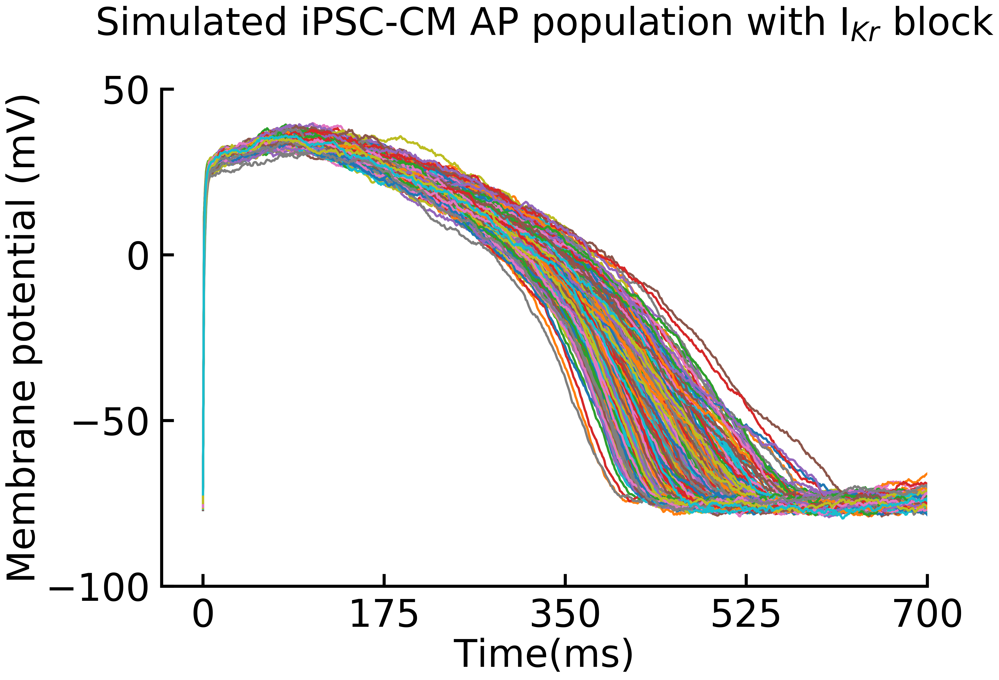

In [15]:
Xplot_Block_ipsc1=Xt_Block_ipsc2.iloc[:, :].values
plt.figure(num=None, figsize=(18, 12), dpi=300)
plt.rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  

plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(0,701, step=175),fontsize=50) 
plt.yticks(np.arange(-100,51, step=50),fontsize=50)
ax.plot(Xplot_Block_ipsc1.transpose(),linewidth=3)
handles, labels = ax.get_legend_handles_labels()
display = (0,Xt_Block_ipsc.shape[0])

plt.xlabel("Time(ms)",fontsize=50)
plt.ylabel("Membrane potential (mV)",fontsize=50)
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color=[0,0,0], lw=5),
                Line2D([0], [0], color=[0.8,0,0], lw=3),
                Line2D([0], [0], color=[0,0,1], lw=3)]


ttl = plt.title("Simulated iPSC-CM AP population with I$_{Kr}$ block",fontsize=50)
ttl.set_position([.5, 1.1])
plt.savefig(path_save+'Fig1/Fig41.pdf',  dpi = 300, bbox_inches = 'tight')

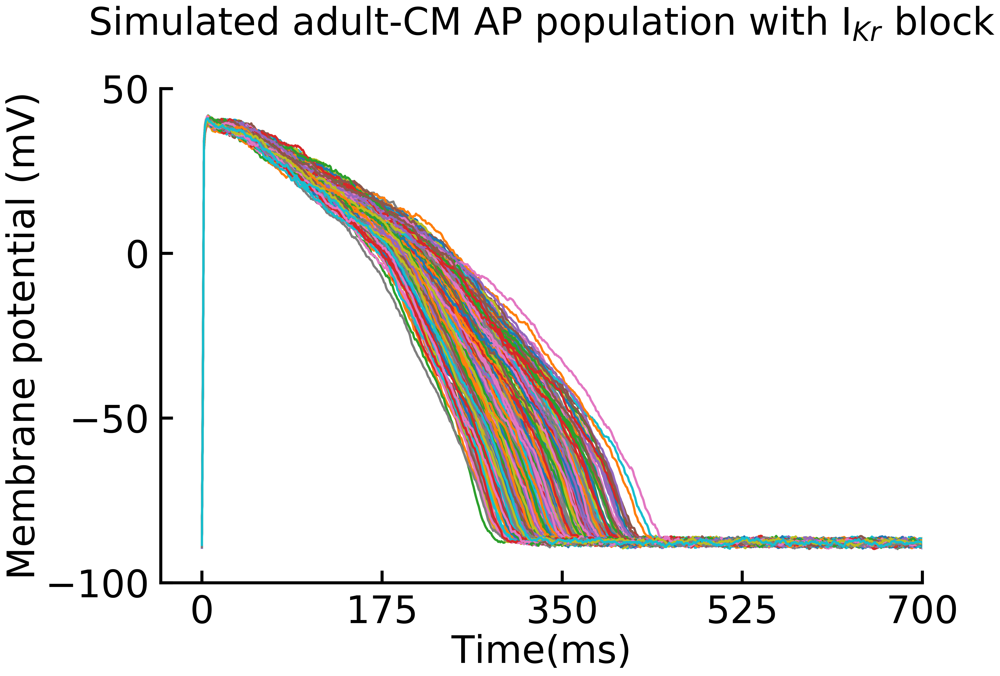

In [16]:
Xplot_Block_adult1=Xt_Block_adult2.iloc[:, :].values
plt.figure(num=None, figsize=(18, 12), dpi=300)
plt.rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)

ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  

plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(0,701, step=175),fontsize=50) 
plt.yticks(np.arange(-100,51, step=50),fontsize=50)
ax.plot(Xplot_Block_adult1.transpose(),linewidth=3)
display = (0,Xt_Block_adult.shape[0])

plt.xlabel("Time(ms)",fontsize=50)
plt.ylabel("Membrane potential (mV)",fontsize=50)
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color=[0,0,0], lw=5),
                Line2D([0], [0], color=[0.8,0,0], lw=3),
                Line2D([0], [0], color=[0,0,1], lw=3)]

ttl = plt.title("Simulated adult-CM AP population with I$_{Kr}$ block",fontsize=50)
ttl.set_position([.5, 1.1])
plt.savefig(path_save+'Fig1/Fig42.pdf',  dpi = 300, bbox_inches = 'tight')

Filter noise

In [17]:
n1 = 7
n2 = 7
m = 0.05
a=50 #font_size

Drug-free iPSC

In [18]:
Xplot_control_ipsc2=pd.DataFrame()
for i in range(Xt_control_ipsc.shape[0]):
    Xplot_control_ipsc21=Xt_control_ipsc.iloc[i, :n1].values
    Xplot_control_ipsc22=Xt_control_ipsc.iloc[i, n1:].values

    b, a = signal.butter(1, m)
    Xplot_control_ipsc22=signal.filtfilt(b,a,Xplot_control_ipsc22,padlen=10)
    Xplot_control_ipsc23=np.append(Xplot_control_ipsc21,Xplot_control_ipsc22)
    Xplot_control_ipsc24 = pd.DataFrame(Xplot_control_ipsc23)
    Xplot_control_ipsc24 = Xplot_control_ipsc24.transpose()
    Xplot_control_ipsc2 = Xplot_control_ipsc2.append(Xplot_control_ipsc24, ignore_index=True, sort=False)
    
Xplot_control_ipsc2 = Xplot_control_ipsc2.iloc[:, :].values
Fi3_ipsc_control2 = Xplot_control_ipsc2

Drug-free adult

In [19]:
Xplot_control_adult2 = pd.DataFrame()
for i in range(Xt_control_adult.shape[0]):
    Xplot_control_adult21=Xt_control_adult.iloc[i, :n2].values
    Xplot_control_adult22=Xt_control_adult.iloc[i, n2:].values

    b, a = signal.butter(1, m)
    Xplot_control_adult22=signal.filtfilt(b,a,Xplot_control_adult22,padlen=10)
    Xplot_control_adult23=np.append(Xplot_control_adult21,Xplot_control_adult22)
    Xplot_control_adult24 = pd.DataFrame(Xplot_control_adult23)
    Xplot_control_adult24 = Xplot_control_adult24.transpose()
    Xplot_control_adult2 = Xplot_control_adult2.append(Xplot_control_adult24, ignore_index=True, sort=False)
    
Xplot_control_adult2 = Xplot_control_adult2.iloc[:, :].values
Fi3_adult_control2 = Xplot_control_adult2

Druged iPSC

In [20]:
Xplot_Block_ipsc2 = pd.DataFrame()
for i in range(Xt_Block_ipsc2.shape[0]):
    Xplot_Block_ipsc21=Xt_Block_ipsc2.iloc[i, :n1].values
    Xplot_Block_ipsc22=Xt_Block_ipsc2.iloc[i, n1:].values

    b, a = signal.butter(1, m)
    Xplot_Block_ipsc22=signal.filtfilt(b,a,Xplot_Block_ipsc22,padlen=10)
    Xplot_Block_ipsc23=np.append(Xplot_Block_ipsc21,Xplot_Block_ipsc22)
    Xplot_Block_ipsc24 = pd.DataFrame(Xplot_Block_ipsc23)
    Xplot_Block_ipsc24 = Xplot_Block_ipsc24.transpose()
    Xplot_Block_ipsc2 = Xplot_Block_ipsc2.append(Xplot_Block_ipsc24, ignore_index=True, sort=False)
    
Xplot_Block_ipsc2 = Xplot_Block_ipsc2.iloc[:, :].values
Fi3_ipsc_block2 = Xplot_Block_ipsc2

Druged adult

In [21]:
Xplot_Block_adult2 = pd.DataFrame()
for i in range(Xt_Block_adult2.shape[0]):
    Xplot_Block_adult21=Xt_Block_adult2.iloc[i, :n2].values
    Xplot_Block_adult22=Xt_Block_adult2.iloc[i, n2:].values

    b, a = signal.butter(1, m)
    Xplot_Block_adult22=signal.filtfilt(b,a,Xplot_Block_adult22,padlen=10)
    Xplot_Block_adult23=np.append(Xplot_Block_adult21,Xplot_Block_adult22)
    Xplot_Block_adult24 = pd.DataFrame(Xplot_Block_adult23)
    Xplot_Block_adult24 = Xplot_Block_adult24.transpose()
    Xplot_Block_adult2 = Xplot_Block_adult2.append(Xplot_Block_adult24, ignore_index=True, sort=False)
    
Xplot_Block_adult2 = Xplot_Block_adult2.iloc[:, :].values
Fi3_adult_block2 = Xplot_Block_adult2

save data

In [22]:
ipsc_normal = pd.DataFrame(Xplot_control_ipsc2)
adult_normal = pd.DataFrame(Xplot_control_adult2)
ipsc_block = pd.DataFrame(Xplot_Block_ipsc2)
adult_block = pd.DataFrame(Xplot_Block_adult2)

In [23]:
input_noise_filter=ipsc_normal.append(ipsc_block, ignore_index=True, sort=False)
target_noise_filter=adult_normal.append(adult_block, ignore_index=True, sort=False)

In [24]:
# input_noise_filter.to_csv(path_read+'input_without_noise_final.csv')
# target_noise_filter.to_csv(path_read+'target_without_noise_final.csv')

Fig5

c:\users\parya\py36\lib\site-packages\ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  import sys


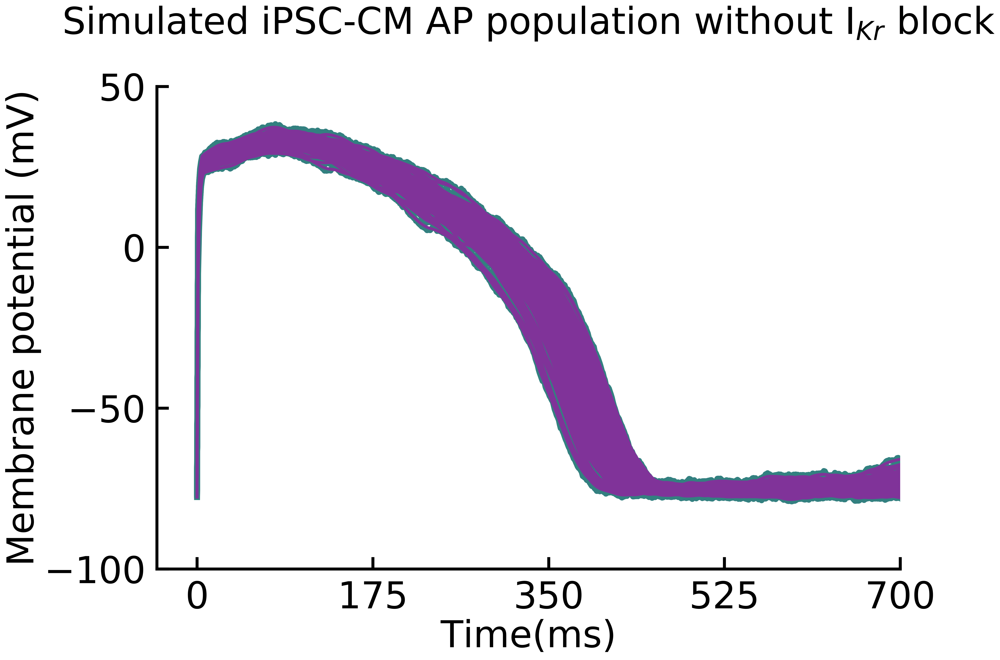

In [25]:
plt.figure(num=None, figsize=(18, 12), dpi=300)
plt.rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)
ax = plt.subplot(111)
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)    
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.xticks(np.arange(0,701, step=175),fontsize=50) 
plt.yticks(np.arange(-100,51, step=50),fontsize=50)

# plt.ylim(-100, 50) 
plt.plot(Fi3_ipsc_control1.transpose(),color=[0.2,0.5,0.5],linewidth=8,label='Noisy traces')
plt.plot(Fi3_ipsc_control2.transpose(),color=[0.5,0.2,0.6],linewidth=4,label='Noise-filtered traces')

plt.xlabel("Time(ms)",fontsize=50)
plt.ylabel("Membrane potential (mV)",fontsize=50)
ttl= plt.title("Simulated iPSC-CM AP population without I$_{Kr}$ block",fontsize=50)
ttl.set_position([.5, 1.1])
plt.savefig(path_save+'Fig5/Fig11.pdf', dpi = 300, bbox_inches = 'tight')

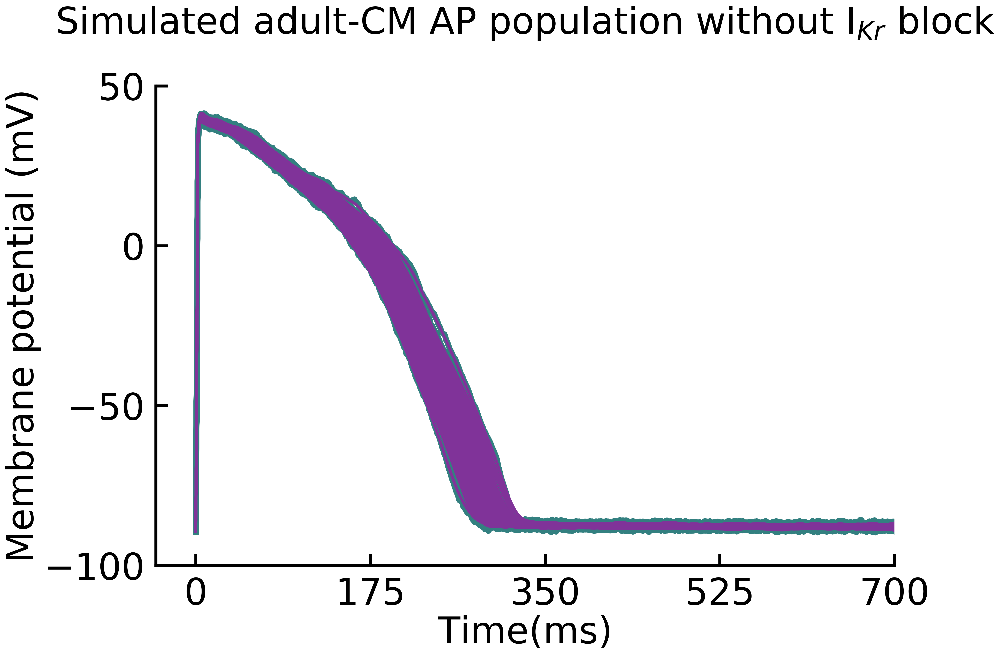

In [26]:
plt.figure(num=None, figsize=(18, 12), dpi=300)
plt.rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)   
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.xticks(np.arange(0,701, step=175),fontsize=50) 
plt.yticks(np.arange(-100,51, step=50),fontsize=50)
plt.plot(Xplot_control_adult1.transpose(),color=[0.2,0.5,0.5],linewidth=8,label='Noisy traces')
plt.plot(Xplot_control_adult2.transpose(),color=[0.5,0.2,0.6],linewidth=4,label='Noise-filtered traces')
plt.xlabel("Time(ms)",fontsize=50)
plt.ylabel("Membrane potential (mV)",fontsize=50)
ttl = plt.title("Simulated adult-CM AP population without I$_{Kr}$ block",fontsize=50)
ttl.set_position([.5, 1.1])
plt.savefig(path_save+'Fig5/Fig21.pdf', dpi = 300, bbox_inches = 'tight')

Read without_noise data

In [27]:
dist_ipsc_nonoise_block=pd.read_csv(path_read+"IPSC_Block_0_to_50_case_without_noise.csv",header=None)
dist_adult_nonoise_block=pd.read_csv(path_read+"Adult_Block_0_to_50_case_without_noise.csv",header=None)
dist_ipsc_nonoise_block=dist_ipsc_nonoise_block.iloc[:, 48:].values
dist_adult_nonoise_block=dist_adult_nonoise_block.iloc[:, :].values

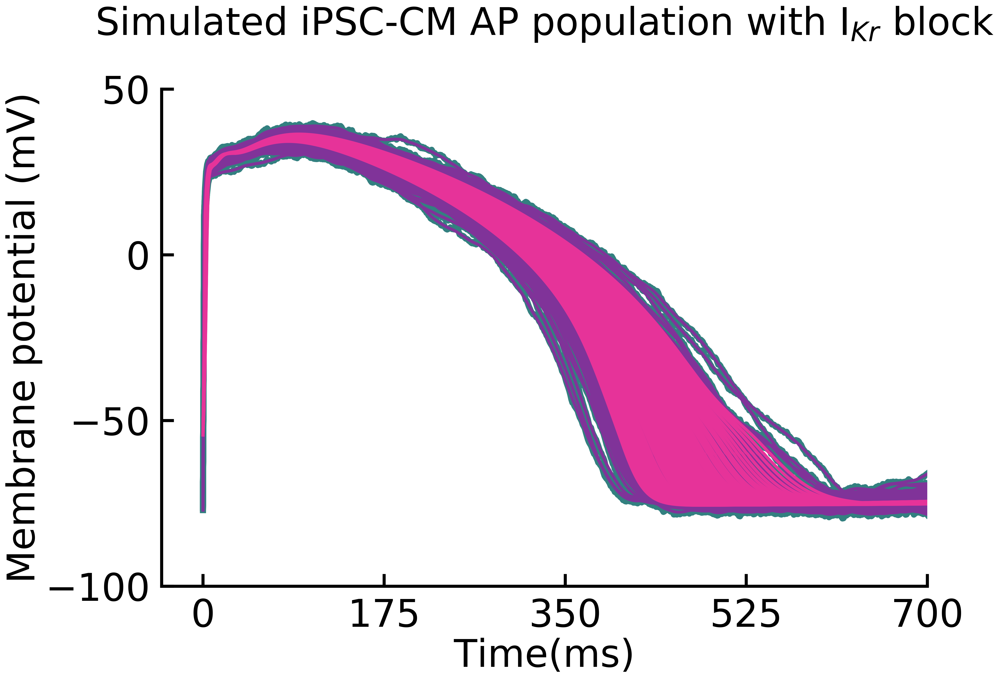

In [28]:
plt.figure(num=None, figsize=(18, 12), dpi=300)
plt.rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  

plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)
  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(0,701, step=175),fontsize=50) 
plt.yticks(np.arange(-100,51, step=50),fontsize=50)

ax.plot(Xplot_Block_ipsc1.transpose(),linewidth=8,color=[0.2,0.5,0.5],label='Noisy traces')
ax.plot(Xplot_Block_ipsc2.transpose(),linewidth=4,color=[0.5,0.2,0.6],label='Noise-filtered traces')

ax.plot(dist_ipsc_nonoise_block.transpose(),linewidth=4,color=[0.9,0.2,0.6],label='Without noise traces')
handles, labels = ax.get_legend_handles_labels()
display = (0,Xt_Block_ipsc.shape[0])

plt.xlabel("Time(ms)",fontsize=50)
plt.ylabel("Membrane potential (mV)",fontsize=50)
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color=[0,0,0], lw=5),
                Line2D([0], [0], color=[0.5,0.2,0.6], lw=3),
                Line2D([0], [0], color=[0.9,0.2,0.6], lw=3)]

ttl = plt.title("Simulated iPSC-CM AP population with I$_{Kr}$ block",fontsize=50)
ttl.set_position([.5, 1.1])
plt.savefig(path_save+'Fig5/Fig31.pdf', dpi = 300, bbox_inches = 'tight')

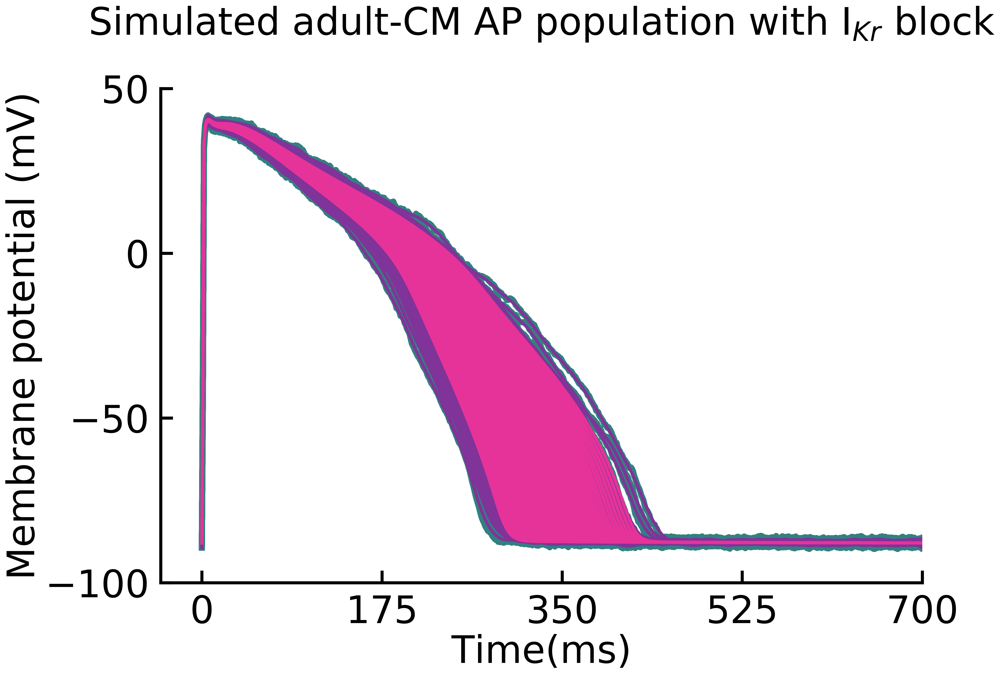

In [29]:
plt.figure(num=None, figsize=(18, 12), dpi=300)
plt.rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  

plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(0,701, step=175),fontsize=50) 
plt.yticks(np.arange(-100,51, step=50),fontsize=50)
ax.plot(Xplot_Block_adult1.transpose(),linewidth=8,color=[0.2,0.5,0.5],label='Noisy traces')
ax.plot(Xplot_Block_adult2.transpose(),linewidth=4,color=[0.5,0.2,0.6],label='Noise-filtered traces')

ax.plot(dist_adult_nonoise_block.transpose(),linewidth=4,color=[0.9,0.2,0.6],label='Without noise traces')
handles, labels = ax.get_legend_handles_labels()
display = (0,Xt_Block_ipsc.shape[0])

plt.xlabel("Time(ms)",fontsize=50)
plt.ylabel("Membrane potential (mV)",fontsize=50)
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color=[0,0,0], lw=5),
                Line2D([0], [0], color=[0.5,0.2,0.6], lw=3),
                Line2D([0], [0], color=[0.9,0.2,0.6], lw=3)]


ttl = plt.title("Simulated adult-CM AP population with I$_{Kr}$ block",fontsize=50)
ttl.set_position([.5, 1.1])
plt.savefig(path_save+'Fig5/Fig41.pdf', dpi = 300, bbox_inches = 'tight')

Noise_filtering_effects on APD90

Drug_free iPSC

In [30]:
APD90_control_iPSC_orig=[]
for i in range(len(Xplot_control_ipsc1)):
    mai = Xplot_control_ipsc1[i,7]
    mii = Xplot_control_ipsc1[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(Xplot_control_ipsc1[i], l)
    p=np.where(Xplot_control_ipsc1[i]==t)
    APD90_control_iPSC_orig.append(p[0])
    
APD90_control_iPSC_orig=pd.DataFrame(APD90_control_iPSC_orig) 

APD90_control_iPSC=[]
for i in range(len(Xplot_control_ipsc2)):
    mai = Xplot_control_ipsc2[i,7]
    mii = Xplot_control_ipsc2[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(Xplot_control_ipsc2[i], l)
    p=np.where(Xplot_control_ipsc2[i]==t)
    APD90_control_iPSC.append(p[0])
    
APD90_control_iPSC=pd.DataFrame(APD90_control_iPSC) 

Drud-free adult

In [31]:
APD90_control_adult_orig=[]
for i in range(len(Xplot_control_adult1)):
    mai = Xplot_control_adult1[i,7]
    mii = Xplot_control_adult1[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(Xplot_control_adult1[i], l)
    p=np.where(Xplot_control_adult1[i]==t)
    APD90_control_adult_orig.append(p[0])
    
APD90_control_adult_orig=pd.DataFrame(APD90_control_adult_orig) 

APD90_control_adult=[]
for i in range(len(Xplot_control_adult2)):
    mai = Xplot_control_adult2[i,7]
    mii = Xplot_control_adult2[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(Xplot_control_adult2[i], l)
    p=np.where(Xplot_control_adult2[i]==t)
    APD90_control_adult.append(p[0])
    
APD90_control_adult2=pd.DataFrame(APD90_control_adult) 

Druged_iPSC

In [32]:
APD90_block_iPSC_orig=[]
for i in range(len(Xplot_Block_ipsc1)):
    mai = Xplot_Block_ipsc1[i,7]
    mii = Xplot_Block_ipsc1[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(Xplot_Block_ipsc1[i], l)
    p=np.where(Xplot_Block_ipsc1[i]==t)
    APD90_block_iPSC_orig.append(p[0])
    
APD90_block_iPSC_orig=pd.DataFrame(APD90_block_iPSC_orig) 

APD90_block_iPSC=[]
for i in range(len(Xplot_Block_ipsc2)):
    mai = Xplot_Block_ipsc2[i,7]
    mii = Xplot_Block_ipsc2[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(Xplot_Block_ipsc2[i], l)
    p=np.where(Xplot_Block_ipsc2[i]==t)
    APD90_block_iPSC.append(p[0])
    
APD90_block_iPSC=pd.DataFrame(APD90_block_iPSC) 

APD90_block_iPSC_nonoise=[]
for i in range(len(dist_ipsc_nonoise_block)):
    mai = dist_ipsc_nonoise_block[i,7]
    mii = dist_ipsc_nonoise_block[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(dist_ipsc_nonoise_block[i], l)
    p=np.where(dist_ipsc_nonoise_block[i]==t)
    APD90_block_iPSC_nonoise.append(p[0])
    
APD90_block_iPSC_nonoise=pd.DataFrame(APD90_block_iPSC_nonoise) 

Druged adult

In [33]:
APD90_block_adult_orig=[]
for i in range(len(Xplot_Block_adult1)):
    mai = Xplot_Block_adult1[i,7]
    mii = Xplot_Block_adult1[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(Xplot_Block_adult1[i], l)
    p=np.where(Xplot_Block_adult1[i]==t)
    APD90_block_adult_orig.append(p[0])
    
APD90_block_adult_orig=pd.DataFrame(APD90_block_adult_orig) 

APD90_block_adult=[]
for i in range(len(Xplot_Block_adult2)):
    mai = Xplot_Block_adult2[i,7]
    mii = Xplot_Block_adult2[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(Xplot_Block_adult2[i], l)
    p=np.where(Xplot_Block_adult2[i]==t)
    APD90_block_adult.append(p[0])
    
APD90_block_adult2=pd.DataFrame(APD90_block_adult) 

APD90_block_adult_nonoise=[]
for i in range(len(dist_adult_nonoise_block)):
    mai = dist_adult_nonoise_block[i,7]
    mii = dist_adult_nonoise_block[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(dist_adult_nonoise_block[i], l)
    p=np.where(dist_adult_nonoise_block[i]==t)
    APD90_block_adult_nonoise.append(p[0])
    
APD90_block_adult_nonoise=pd.DataFrame(APD90_block_adult_nonoise) 

Fig3 APD90histogram distributions

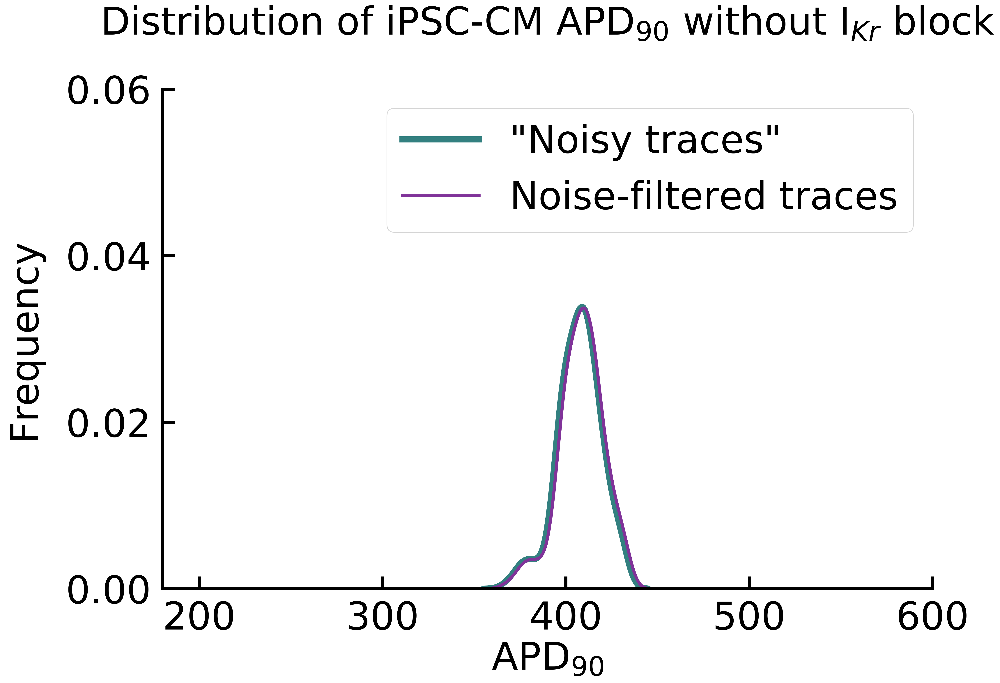

In [34]:
plt.figure(num=None, figsize=(18, 12), dpi=300)
dist_control_iPSC_orig=APD90_control_iPSC_orig.iloc[:, 0].values
dist_control_iPSC=APD90_control_iPSC.iloc[:, 0].values
plt.rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)
plt.xlim(180, 600) 
plt.ylim(0, 0.06) 
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(200,601, step=100),fontsize=50) 
plt.yticks(np.arange(0,0.061, step=0.02),fontsize=50)

sns.kdeplot(dist_control_iPSC_orig, color=[0.2,0.5,0.5],linewidth=8, label="Noisy traces",legend=False)
sns.kdeplot(dist_control_iPSC, color=[0.5,0.2,0.6],linewidth=4, label="Noise-filtered traces",legend=False)
plt.xlabel("APD$_{90}$",fontsize=50)
plt.ylabel("Frequency",fontsize=50,labelpad=30)
ttl=plt.title("Distribution of iPSC-CM APD$_{90}$ without I$_{Kr}$ block",fontsize=50)
ttl.set_position([.5, 1.1])
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color=[0.2,0.5,0.5], lw=8),
                Line2D([0], [0], color=[0.5,0.2,0.6], lw=4)
                ]

ax.legend(custom_lines, ['"Noisy traces"', 'Noise-filtered traces', 'Without noise traces'],loc = 'upper right', prop={'size': 50})
plt.savefig(path_save+'Fig5/Fig12.pdf', dpi = 300, bbox_inches = 'tight')

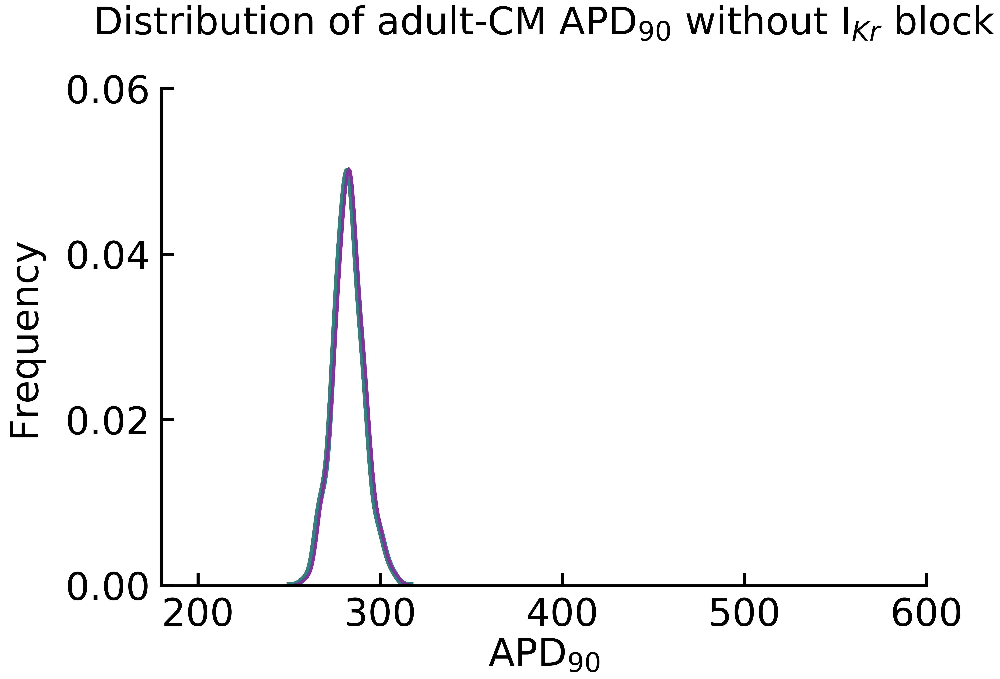

In [35]:
plt.figure(num=None, figsize=(18, 12), dpi=300)
dist_control_adult_orig=APD90_control_adult_orig.iloc[:, 0].values
dist_control_adult=APD90_control_adult2.iloc[:, 0].values
plt.rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)
plt.xlim(180, 600) 
plt.ylim(0, 0.06)  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.xticks(np.arange(200,601, step=100),fontsize=50) 
plt.yticks(np.arange(0,0.061, step=0.02),fontsize=50)

sns.kdeplot(dist_control_adult_orig, color=[0.2,0.5,0.5],linewidth=8, label="Noisy traces",legend=False)
sns.kdeplot(dist_control_adult, color=[0.5,0.2,0.6],linewidth=4, label="Noise-filtered traces ",legend=False)

plt.xlabel("APD$_{90}$",fontsize=50)
plt.ylabel("Frequency",fontsize=50,labelpad=30)
ttl=plt.title("Distribution of adult-CM APD$_{90}$ without I$_{Kr}$ block",fontsize=50)
ttl.set_position([.5, 1.1])
plt.savefig(path_save+'Fig5/Fig22.pdf', dpi = 300, bbox_inches = 'tight')

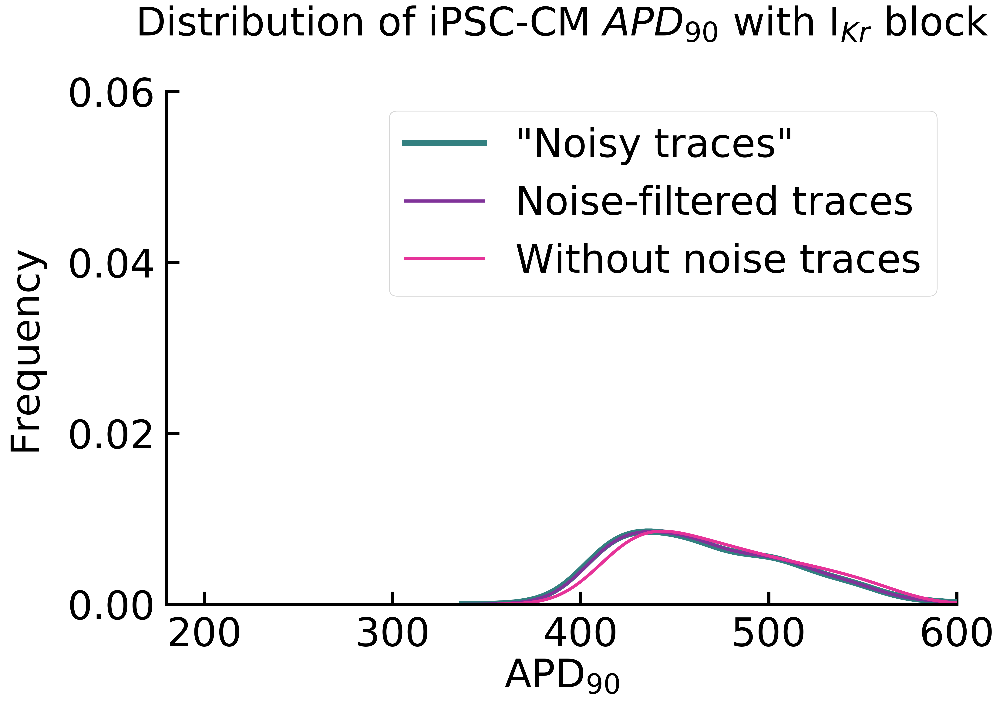

In [36]:
plt.figure(num=None, figsize=(18, 12), dpi=300)
dist_block_iPSC_orig=APD90_block_iPSC_orig.iloc[:, 0].values
dist_block_iPSC=APD90_block_iPSC.iloc[:, 0].values
dist_block_iPSC_nonoise=APD90_block_iPSC_nonoise.iloc[:, 0].values
plt.rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)
plt.xlim(180, 600) 
plt.ylim(0, 0.06)  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(200,601, step=100),fontsize=50) 
plt.yticks(np.arange(0,0.061, step=0.02),fontsize=50)

sns.kdeplot(dist_block_iPSC_orig, color=[0.2,0.5,0.5],linewidth=8, legend=False)
sns.kdeplot(dist_block_iPSC, color=[0.5,0.2,0.6],linewidth=4, legend=False)
sns.kdeplot(dist_block_iPSC_nonoise, color=[0.9,0.2,0.6], linewidth=4, legend=False)

plt.xlabel("APD$_{90}$",fontsize=50)
plt.ylabel("Frequency",fontsize=50,labelpad=30)
ttl=plt.title("Distribution of iPSC-CM $APD_{90}$ with I$_{Kr}$ block",fontsize=50)
ttl.set_position([.5, 1.1])

from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color=[0.2,0.5,0.5], lw=8),
                Line2D([0], [0], color=[0.5,0.2,0.6], lw=4),
                Line2D([0], [0], color=[0.9,0.2,0.6], lw=4)]


ax.legend(custom_lines, ['"Noisy traces"', 'Noise-filtered traces', 'Without noise traces'],loc = 'upper right', prop={'size': 50})


plt.savefig(path_save+'Fig5/Fig32.pdf', dpi = 300, bbox_inches = 'tight')

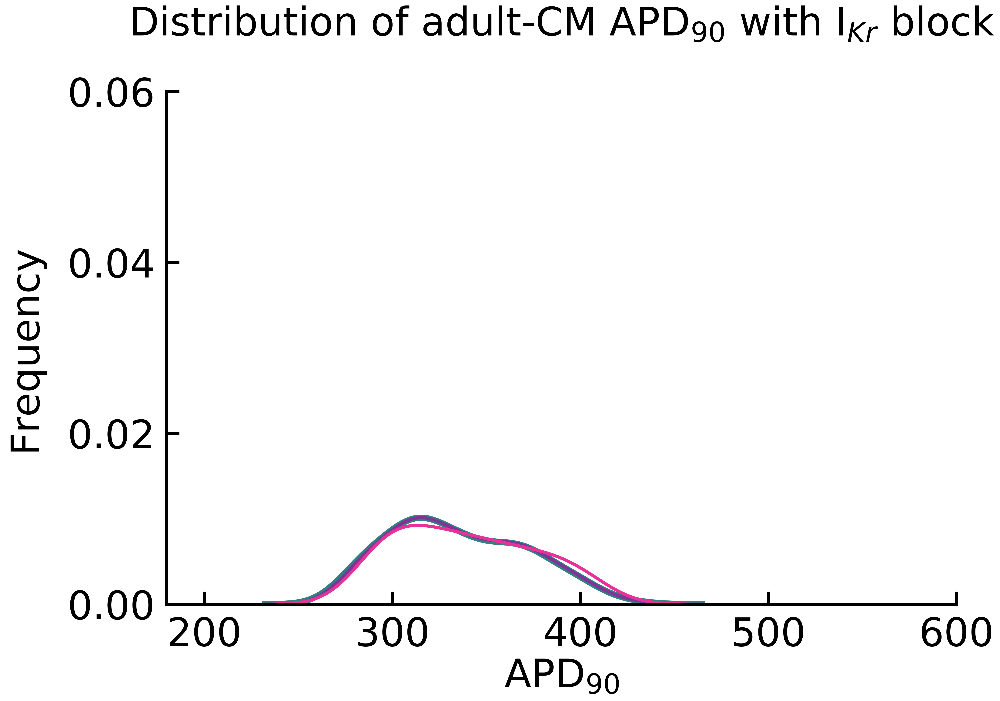

In [38]:
plt.figure(num=None, figsize=(18, 12), dpi=300)
dist_block_adult_orig=APD90_block_adult_orig.iloc[:, 0].values
dist_block_adult=APD90_block_adult2.iloc[:, 0].values
dist_block_adult_nonoise=APD90_block_adult_nonoise.iloc[:, 0].values

plt.rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)

plt.xlim(180, 600) 
plt.ylim(0, 0.06) 
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.xticks(np.arange(200,601, step=100),fontsize=50) 
plt.yticks(np.arange(0,0.061, step=0.02),fontsize=50)
sns.kdeplot(dist_block_adult_orig, color=[0.2,0.5,0.5],linewidth=8, label="Noisy traces",legend=False)
sns.kdeplot(dist_block_adult, color=[0.5,0.2,0.6],linewidth=4, label="Noise-filtered traces ",legend=False)
sns.kdeplot(dist_block_adult_nonoise, color=[0.9,0.2,0.6], linewidth=4, label="Without noise traces ",legend=False)

plt.xlabel("APD$_{90}$",fontsize=50)
plt.ylabel("Frequency",fontsize=50,labelpad=30)
ttl=plt.title("Distribution of adult-CM APD$_{90}$ with I$_{Kr}$ block",fontsize=50)
ttl.set_position([.5, 1.1])


plt.savefig(path_save+'Fig5/Fig42.pdf', dpi = 300, bbox_inches = 'tight')